In [1]:
from pymongo import ASCENDING, GEOSPHERE, MongoClient
import pandas as pd
from alive_progress import alive_bar
from shapely.geometry import Point, mapping
from keplergl import KeplerGl
import shapely
import json
from os import listdir
from os.path import isfile, join
from tqdm import tqdm
import geopandas as gpd
from h3 import h3
import math
import sklearn
import numpy as np
import time

In [2]:
client = MongoClient('mongodb://localhost:27017/')
db = client.osmDataDB
coll_results = db.experimentsResults
coll_results_bak = db.experimentsResultsBak

In [3]:
results_new = [r for r in coll_results.find({'city': { '$in': ['Warszawa', 'Wrocław', 'Poznań']}})]
results_bak = [r for r in coll_results_bak.find({'city': { '$in': ['Warszawa', 'Wrocław', 'Poznań']}})]

In [4]:
print(len(results_new), len(results_bak))

5859 5071


In [5]:
results = results_new

In [6]:
def exists_result(res):
    city = res["city"]
    resolution = res["resolution"]
    inbalance_ratio = res["inbalance_ratio"]
    embedding_cls = res["embedding_cls"]
    neighbours = res["neighbours"]
    neighbour_embedding_cls = res["neighbour_embedding_cls"]
    x_processing = res["x_processing"]
    return any([r["city"] == city and r["resolution"] == resolution and r["inbalance_ratio"] == inbalance_ratio and r["embedding_cls"] == embedding_cls and r["neighbours"] == neighbours and r["neighbour_embedding_cls"] == neighbour_embedding_cls and r["x_processing"] == x_processing for r in results])

In [7]:
for result in tqdm(results_bak):
    if not exists_result(result):
        results.append(result)
len(results)

100%|██████████| 5071/5071 [00:10<00:00, 479.29it/s]


7193

In [26]:
# neighbour_embedding_cls_dict = {
#     'AverageDiminishingSquqredNeighbourEmbedding': 'Average Diminishing Squared Neighbour Embedding',
#     'ConcatenateNeighbourEmbedding': 'Concatenate Neighbour Embedding',
#     'AverageDiminishingNeighbourEmbedding': 'Average Diminishing Neighbour Embedding',
#     'AverageNeighbourEmbedding': 'Average Neighbour Embedding',
# }
neighbour_embedding_cls_dict = {
    'AverageDiminishingSquqredNeighbourEmbedding': 'Average Diminishing Squared',
    'ConcatenateNeighbourEmbedding': 'Concatenate',
    'AverageDiminishingNeighbourEmbedding': 'Average Diminishing',
    'AverageNeighbourEmbedding': 'Average',
}

neighbour_embedding_cls_dict = {
    'AverageDiminishingSquqredNeighbourEmbedding': 'Average\nDiminishing\nSquared',
    'ConcatenateNeighbourEmbedding': 'Concatenate',
    'AverageDiminishingNeighbourEmbedding': 'Average\nDiminishing',
    'AverageNeighbourEmbedding': 'Average',
}
embedding_cls_dict = {
    'BaseCountCategoryEmbedding': 'Count Category Embedding',
    'BaseShapeAnalyzerEmbedding': 'Shape Analyzer Embedding',
    # 'PerCategoryShapeAnalyzerEmbedding300': 'All Tags Shape Analyzer\nEmbedding 300',
    # 'PerCategoryFilteredShapeAnalyzerEmbedding300': 'Selected Tags Shape Analyzer\nEmbedding 300'
}
processing_dict = {
    # 'None': 'None',
    'MinMaxScaler': 'Normalization',
    # 'StandardScaler': 'Standardization'
}
metric_dict = {
    'accuracy': 'Accuracy',
    'f1_score': 'F1 Score',
    'custom_metric': 'Custom metric',
}
parsed_results = []
flat_parsed_results = []
for r in results:
    for it in r['results']:
        if r['neighbour_embedding_cls'] in neighbour_embedding_cls_dict and \
            r['embedding_cls'] in embedding_cls_dict and \
            r['x_processing'] in processing_dict:
            parsed_results.append({
                'city': r['city'],
                'resolution': r['resolution'],
                'inbalance_ratio': r['inbalance_ratio'],
                'embedding_cls': embedding_cls_dict[r['embedding_cls']],
                'neighbours': r['neighbours'],
                'processing': processing_dict[r['x_processing']],
                'neighbour_embedding_cls': neighbour_embedding_cls_dict[r['neighbour_embedding_cls']],
                'classfier_cls': it['classfier_cls'],
                'iteration': it['iteration'],
                'dataset_type': it['dataset_type'],
                'Accuracy': it['accuracy'],
                'F1 Score': it['f1_score'],
                'Custom metric': it['custom_metric'],
            })
            for metric in ['accuracy', 'custom_metric', 'f1_score']:
                flat_parsed_results.append({
                    'city': r['city'],
                    'resolution': r['resolution'],
                    'inbalance_ratio': r['inbalance_ratio'],
                    'embedding_cls': embedding_cls_dict[r['embedding_cls']],
                    'neighbours': r['neighbours'],
                    'processing': processing_dict[r['x_processing']],
                    'neighbour_embedding_cls': neighbour_embedding_cls_dict[r['neighbour_embedding_cls']],
                    'classfier_cls': it['classfier_cls'],
                    'iteration': it['iteration'],
                    'dataset_type': it['dataset_type'],
                    'metric': metric_dict[metric],
                    'value': it[metric],
                })

In [9]:
df = pd.DataFrame(parsed_results)

In [27]:
df_flat = pd.DataFrame(flat_parsed_results)

In [9]:
for column in ['embedding_cls', 'neighbour_embedding_cls', 'classfier_cls', 'dataset_type', 'processing']:
    values = list(df[column].unique())
    print(values)
    df[f'{column}_num'] = [values.index(v) for v in df[column]]
df

NameError: name 'df' is not defined

In [28]:
grpd = df_flat.groupby(['city', 'embedding_cls', 'neighbour_embedding_cls']).count()
grpd
    

resolution  \
city     embedding_cls            neighbour_embedding_cls                     
Poznań   Count Category Embedding Average                             12480   
                                  Average\nDiminishing                12480   
                                  Average\nDiminishing\nSquared       17880   
                                  Concatenate                         16260   
         Shape Analyzer Embedding Average                             12480   
                                  Average\nDiminishing                12480   
                                  Average\nDiminishing\nSquared       12480   
                                  Concatenate                         15360   
Warszawa Count Category Embedding Average                             12480   
                                  Average\nDiminishing                12480   
                                  Average\nDiminishing\nSquared       17880   
                                  Concatenate                         16260   
         Shape Analyzer Embedding Average                             12480   
                                  Average\nDiminishing                12480   
                                  Average\nDiminishing\nSquared       12480   
                                  Concatenate                         15360   
Wrocław  Count Category Embedding Average                             12480   
                                  Average\nDiminishing                12480   
                                  Average\nDiminishing\nSquared       17880   
                                  Concatenate                         16260   
         Shape Analyzer Embedding Average                             12480   
                                  Average\nDiminishing                12480   
                                  Average\nDiminishing\nSquared       12480   
                                  Concatenate                         15360   

                                                                 inbalance_ratio  \
city     embedding_cls            neighbour_embedding_cls                          
Poznań   Count Category Embedding Average                                  12480   
                                  Average\nDiminishing                     12480   
                                  Average\nDiminishing\nSquared            17880   
                                  Concatenate                              16260   
         Shape Analyzer Embedding Average                                  12480   
                                  Average\nDiminishing                     12480   
                                  Average\nDiminishing\nSquared            12480   
                                  Concatenate                              15360   
Warszawa Count Category Embedding Average                                  12480   
                                  Average\nDiminishing                     12480   
                                  Average\nDiminishing\nSquared            17880   
                                  Concatenate                              16260   
         Shape Analyzer Embedding Average                                  12480   
                                  Average\nDiminishing                     12480   
                                  Average\nDiminishing\nSquared            12480   
                                  Concatenate                              15360   
Wrocław  Count Category Embedding Average                                  12480   
                                  Average\nDiminishing                     12480   
                                  Average\nDiminishing\nSquared            17880   
                                  Concatenate                              16260   
         Shape Analyzer Embedding Average                                  12480   
                                  Average\nDiminishing                     124

In [8]:
import plotly.graph_objects as go
fig = go.Figure(
    layout=go.Layout(height=600, width=1600),
    data=go.Parcoords(
        # line = dict(color = df['f1_score'], colorscale = 'Electric', showscale = True),
        line = dict(color = df['custom_metric'], colorscale = 'Viridis', showscale = True),
        dimensions = [
            dict(ticktext = df['dataset_type'].unique(), tickvals = df['dataset_type_num'].unique(),
                        label = 'dataset_type', values = df['dataset_type_num']),
            dict(ticktext = df['embedding_cls'].unique(), tickvals = df['embedding_cls_num'].unique(),
                 label = 'embedding_cls', values = df['embedding_cls_num']),
            dict(ticktext = df['neighbour_embedding_cls'].unique(), tickvals = df['neighbour_embedding_cls_num'].unique(),
                 label = 'neighbour_embedding_cls', values = df['neighbour_embedding_cls_num']),
            dict(ticktext = df['classfier_cls'].unique(), tickvals = df['classfier_cls_num'].unique(),
                        label = 'classfier_cls', values = df['classfier_cls_num']),
            dict(ticktext = df['resolution'].unique(), tickvals = df['resolution'].unique(),
                        label = 'resolution', values = df['resolution']),
            dict(ticktext = df['neighbours'].unique(), tickvals = df['neighbours'].unique(),
                        label = 'neighbours', values = df['neighbours']),
            dict(ticktext = df['inbalance_ratio'].unique(), tickvals = df['inbalance_ratio'].unique(),
                        label = 'inbalance_ratio', values = df['inbalance_ratio']),
            dict(range = [0.5,1],
                 label = 'accuracy', values = df['accuracy']),
            dict(range = [0.5,1],
                 label = 'custom_metric', values = df['custom_metric']),
            dict(range = [0,1],
                 label = 'f1_score', values = df['f1_score'])
        ]
    )
)
fig.show()

In [12]:
import seaborn as sns
import matplotlib.pyplot as plt
# sns.set_theme()
sns.set_style("whitegrid")

In [34]:
def vertical_mean_line(x, **kwargs):
    ax = plt.gca()
    v = x.mean()
    plt.axvline(v, ymin=0.05, **kwargs)
    ax.text(v, .045, f"{v:.3f}", color='k', transform=ax.get_xaxis_transform(),
            ha='center', va='top')

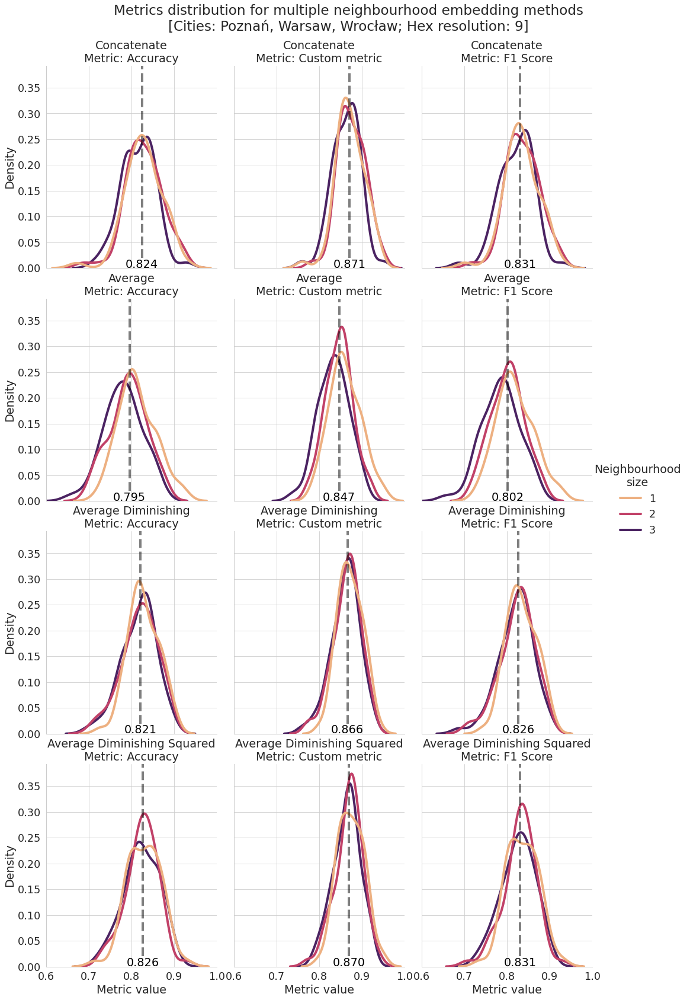

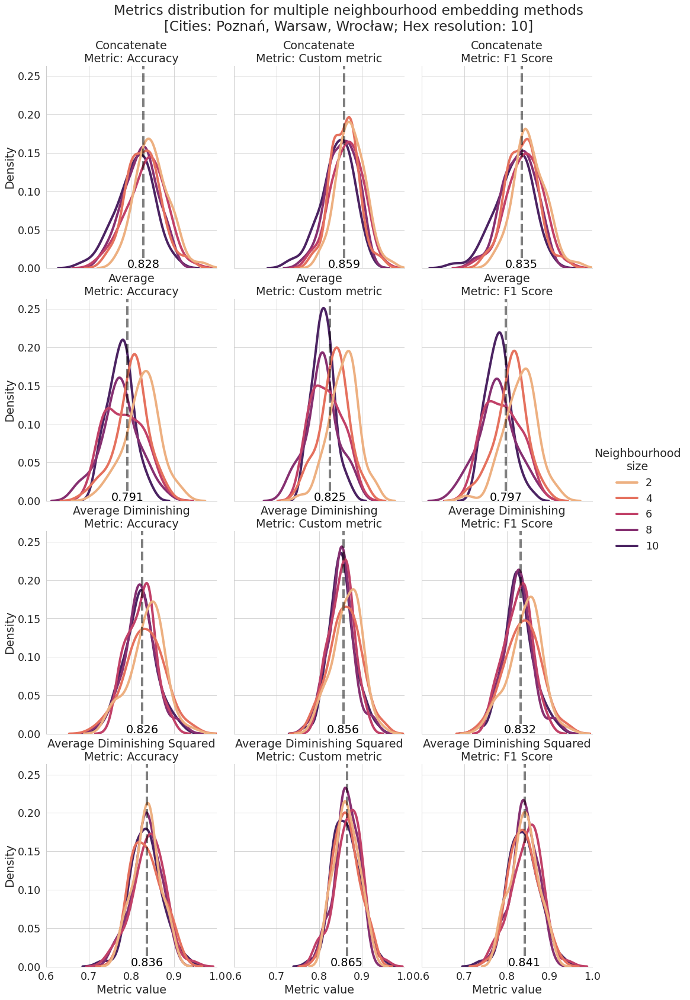

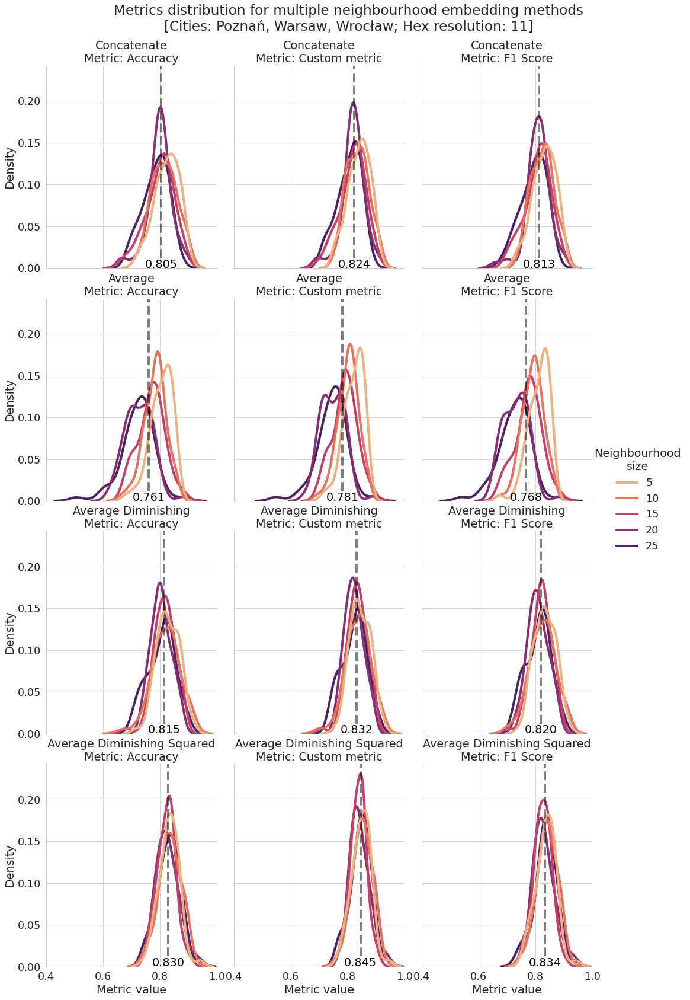

In [16]:
sns.set_context("paper", font_scale=2, rc={"lines.linewidth": 4})
# with sns.plotting_context(font_scale=1.5):
for res in [9, 10, 11]:
# for metric in ['f1_score', 'accuracy', 'custom_metric']:
    filtered_df = df_flat.loc[
        (df_flat.resolution == res) & \
        (df_flat.dataset_type == 'validation') & \
        (df_flat.classfier_cls == 'RandomForestClassifier') & \
        (df_flat.neighbours > 0) & \
        (df_flat.inbalance_ratio == 1)]
    g = sns.displot(
        data=filtered_df, x="value", hue="neighbours", row="neighbour_embedding_cls", col="metric",
        facet_kws=dict(row_order=['Concatenate', 'Average', 'Average Diminishing', 'Average Diminishing Squared']),
        kind="kde", height=6, aspect=0.8, palette="flare"
    )
    if res == 11:
        plt.xlim(0.4, 1)
    else:
        plt.xlim(0.6, 1)
    # g.set_axis_labels("Density", f"Metric: {metric}")
    g.map(vertical_mean_line, 'value', color='k', ls='--', alpha=0.5)
    g.set_axis_labels("Metric value", "Density")
    g.set_titles("{row_name}\nMetric: {col_name}")
    g.fig.subplots_adjust(wspace=0.1, hspace=0.15)
    g.fig.subplots_adjust(top=0.92) # adjust the Figure in rp
    g.fig.suptitle(f'Metrics distribution for multiple neighbourhood embedding methods\n[Cities: Poznań, Warsaw, Wrocław; Hex resolution: {res}]')
    # plt.legend(title='Neighbourhood size')
    g._legend.set_title("Neighbourhood\nsize")
    g._legend.get_title().set_multialignment('center')
    # plt.tight_layout()
    plt.savefig(f'neighbour_embedding_methods_2_{res}.pdf', dpi=300, format='pdf', bbox_inches='tight')

In [36]:
def vertical_mean_line(x, **kwargs):
    ax = plt.gca()
    v = x.mean()
    # plt.axvline(v, ymin=0.05, **kwargs)
    plt.axvline(v, **kwargs)
    # ax.text(v, .045, f"{v:.3f}", color='k', transform=ax.get_xaxis_transform(),
    #         ha='center', va='top')

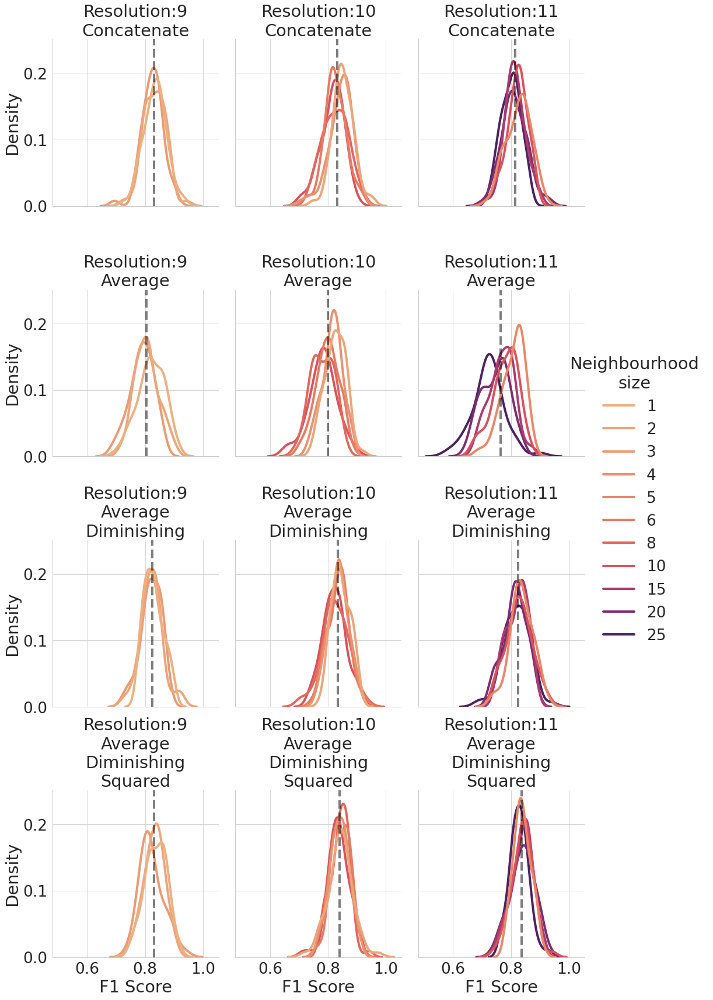

In [39]:
sns.set_context("paper", font_scale=3, rc={"lines.linewidth": 4})
# with sns.plotting_context(font_scale=1.5):
# for res in [9, 10, 11]:
# for metric in ['f1_score', 'accuracy', 'custom_metric']:
filtered_df = df_flat.loc[
    # (df_flat.resolution == res) & \
    (df_flat.dataset_type == 'validation') & \
    (df_flat.classfier_cls == 'RandomForestClassifier') & \
    (df_flat.neighbours > 0) & \
    (df_flat.metric == 'F1 Score') & \
    (df_flat.inbalance_ratio == 1)]
g = sns.displot(
    data=filtered_df, x="value", 
    hue="neighbours", 
    # row="neighbour_embedding_cls", 
    # col="metric",
    col="resolution", 
    row="neighbour_embedding_cls",
    facet_kws=dict(row_order=['Concatenate', 'Average', 'Average\nDiminishing', 'Average\nDiminishing\nSquared']),
    kind="kde", height=6, aspect=0.8, palette="flare"
)
# if res == 11:
#     plt.xlim(0.4, 1)
# else:
#     plt.xlim(0.6, 1)
# g.set_axis_labels("Density", f"Metric: {metric}")
g.map(vertical_mean_line, 'value', color='k', ls='--', alpha=0.5)
g.set_axis_labels("F1 Score", "Density")
g.set_titles("Resolution:{col_name}\n{row_name}")
g.fig.subplots_adjust(wspace=0.1, hspace=0.5)
# g.fig.subplots_adjust(top=0.90) # adjust the Figure in rp
# g.fig.suptitle(f'Metrics distribution for multiple neighbourhood embedding methods\n[Cities: Poznań, Warsaw, Wrocław]')
# plt.legend(title='Neighbourhood size')
g._legend.set_title("Neighbourhood\nsize")
g._legend.get_title().set_multialignment('center')
# plt.tight_layout()
plt.savefig(f'neighbour_embedding_methods_paper.pdf', dpi=300, format='pdf', bbox_inches='tight')